<a href="https://colab.research.google.com/github/n-janssens/River-plastic-monitoring-tool/blob/main/Water_Hyacinth_classification_tool.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


Water Hyacinth classification tool:
Copyright 2020 Niels Janssens

Licensed under the Apache License, Version 2.0 (the "License"); you may not use this file except in compliance with the License. You may obtain a copy of the License at

http://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software distributed under the License is distributed on an "AS IS" BASIS, WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied. See the License for the specific language governing permissions and limitations under the License.

## Install all required modules

In [ ]:
!pip install pandas
!pip install geopandas
!pip install rasterio
!pip install sentinelhub
!pip install eo-learn
!pip install gdal
!pip install shapely
!pip install fiona
!pip install geos
!pip install proj
!pip install scikit-image
!pip install geoviews
!apt-get install -qq libgdal-dev libproj-dev
!apt-get -qq install python-cartopy python3-cartopy
!pip install eo-learn-visualization[FULL]
!apt-get install python-numpy
!apt-get -qq install python-pyepsg python3-pyepsg

     |████████████████████████████████| 972kB 2.8MB/s 
     |████████████████████████████████| 10.9MB 16.8MB/s 
     |████████████████████████████████| 14.8MB 309kB/s 
     |████████████████████████████████| 18.3MB 1.2MB/s 
     |████████████████████████████████| 194kB 2.7MB/s 
     |████████████████████████████████| 133kB 8.5MB/s 
     |████████████████████████████████| 6.7MB 7.9MB/s 
     |████████████████████████████████| 51kB 6.9MB/s 
     |████████████████████████████████| 71kB 9.1MB/s 
  Created wheel for sentinelhub: filename=sentinelhub-3.1.0-cp36-none-any.whl size=196404 sha256=523afae43b5a9d1e941b6176bf4cb5ee3a144c0a98e7d3a134c6fda5e68f71ad
  Stored in directory: /root/.cache/pip/wheels/90/6c/df/be1525ead52f5c2ce49f0880e73587723bf25caac7295f9db2
  Created wheel for utm: filename=utm-0.6.0-cp36-none-any.whl size=6095 sha256=bad7e185a2285613f113822b08c8b3e883f9d76d187bd79e872463823158bb84
  Stored in directory: /root/.cache/pip/wheels/9a/76/b2/58ad7ade8b0475c577f80ee8023d7164fd



## Import required models

In [ ]:
# Built-in modules
import pickle
import sys
import os
import datetime
import itertools
from enum import Enum

# Basics of Python data handling and visualization
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from shapely.geometry import Polygon as Polygon1
from tqdm import tqdm_notebook as tqdm
import shapely
import cartopy
import cartopy.crs as ccrs
import pyepsg
#import geoviews as gv

# Machine learning 
import lightgbm as lgb
import joblib
from sklearn import metrics
from sklearn import preprocessing

# Imports from eo-learn and sentinelhub-py
from eolearn.core import EOTask, SaveTask, EOPatch, LinearWorkflow, FeatureType, OverwritePermission, \
    LoadFromDisk, SaveToDisk, EOExecutor, MergeFeatureTask, LoadTask
from eolearn.io import S2L1CWCSInput, ExportToTiff, S2L2AWCSInput, SentinelHubWMSInput, SentinelHubInputTask, AddSen2CorClassificationFeature
from eolearn.mask import AddCloudMaskTask, get_s2_pixel_cloud_detector, AddValidDataMaskTask, MaskFeature, AddMultiCloudMaskTask
from eolearn.geometry import VectorToRaster, PointSamplingTask, ErosionTask
from eolearn.features import LinearInterpolation, SimpleFilterTask
from sentinelhub import BBoxSplitter, BBox, CRS, CustomUrlParam, DataSource, UtmZoneSplitter
from skimage.filters import threshold_otsu
import eolearn.visualization

from skimage.filters import sobel
from skimage.morphology import disk
from skimage.morphology import erosion, dilation, opening, closing, white_tophat
import copy
import numpy as np
import pandas as pd

# Import Libraries
import pandas 
import numpy 
from matplotlib import pyplot
from sklearn.naive_bayes import GaussianNB 
import sklearn.model_selection

import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

## Configure Sentinelhub settings

In [ ]:
!sentinelhub.config --instance_id ""
!sentinelhub.config --sh_client_id ""
!sentinelhub.config --sh_client_secret ""
!sentinelhub.config --max_download_attempts 15
!sentinelhub.config --download_sleep_time 300
!sentinelhub.config --max_wfs_records_per_query 10
!sentinelhub.config --max_opensearch_records_per_query 10
!sentinelhub.config --show

The value of parameter 'instance_id' was updated to 'a4d1d161-39dc-4874-8d3b-5fa273ceb97c'
The value of parameter 'sh_client_id' was updated to '864b90eb-5210-41fd-8f0a-28f42f21c957'
The value of parameter 'sh_client_secret' was updated to '}m62gB!c5CgLfPY!e-BjlfZVu?!e@20}b;QJRn],'
The value of parameter 'max_download_attempts' was updated to 15
The value of parameter 'download_sleep_time' was updated to 300
The value of parameter 'max_wfs_records_per_query' was updated to 10
The value of parameter 'max_opensearch_records_per_query' was updated to 10
{
  "instance_id": "a4d1d161-39dc-4874-8d3b-5fa273ceb97c",
  "sh_client_id": "864b90eb-5210-41fd-8f0a-28f42f21c957",
  "sh_client_secret": "}m62gB!c5CgLfPY!e-BjlfZVu?!e@20}b;QJRn],",
  "sh_base_url": "https://services.sentinel-hub.com",
  "geopedia_wms_url": "https://service.geopedia.world",
  "geopedia_rest_url": "https://www.geopedia.world/rest",
  "aws_access_key_id": "",
  "aws_secret_access_key": "",
  "aws_metadata_url": "https://rod

## Test and train manually identified Water Hyacinth and Water for supervised classification pixels

Classification fit using all data: 0.99


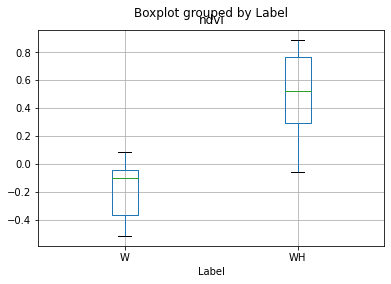

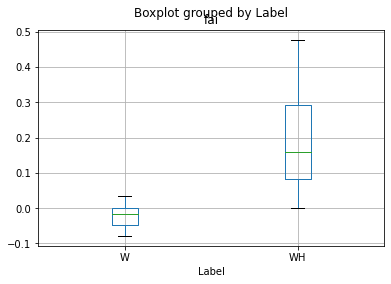

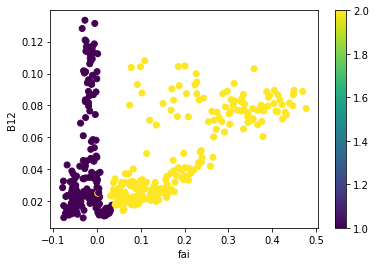

['./model_SI_LULC.pkl']

In [ ]:
%matplotlib inline

# Read in data
data = pandas.read_csv('./drive/My Drive/points_all.csv')
np.take(data,np.random.permutation(data.shape[0]),axis=0)
testing_data, training_data = sklearn.model_selection.train_test_split(data)

# Convert classes to an integer 
training_classes_int = numpy.zeros(training_data["Label"].values.shape, dtype=numpy.uint8) 
training_classes_int[training_data["Label"].values == "WH"] = 2 
training_classes_int[training_data["Label"].values == "W"] = 1

# Convert classes to an integer 
testing_classes_int = numpy.zeros(testing_data["Label"].values.shape, dtype=numpy.uint8) 
testing_classes_int[testing_data["Label"].values == "WH"]   = 2 
testing_classes_int[testing_data["Label"].values == "W"] = 1 

# Convert to one numpy array 
training_array = numpy.array([training_classes_int, training_data["ndvi"].values, training_data["fai"].values, 
                              training_data["B2"].values, training_data["B3"].values, training_data["B12"].values]) 

# Flip around
training_array = training_array.transpose()

# Convert to one numpy array 
testing_array = numpy.array([testing_classes_int, testing_data["ndvi"].values, testing_data["fai"].values, 
                             testing_data["B2"].values, testing_data["B3"].values, testing_data["B12"].values]) 

# Flip around
testing_array = testing_array.transpose()

# Train model 
gnb = GaussianNB() 
class_model = gnb.fit(training_array[:,1:], training_array[:,0]) 

# Check fit. Note as this uses exactly the same data as training doesn't represent accuracy.
# It does give a rough idea of how well model fits though
score = class_model.score(testing_array[:,1:], testing_array[:,0])
print("Classification fit using all data: {:.02}".format(score))

# NDVI and FDI only: 
#class_model = gnb.fit(training_array[:,1:3], training_array[:,0]) 
#score = class_model.score(testing_array[:,1:3], testing_array[:,0])
#print("Classification fit using all FDI and NDVI: {:.02}".format(score))

out_classes = class_model.predict(testing_array[:,1:])


testing_data.boxplot(column="ndvi", by="Label")
plt.savefig('boxplot_1.jpeg')
plt.show()
testing_data.boxplot(column="fai", by="Label")
plt.savefig('boxplot_2.jpeg')
plt.show()

plt.scatter(testing_data["fai"], testing_data["B12"], c=testing_classes_int)
plt.xlabel("fai")
plt.ylabel("B12")
plt.colorbar()
plt.savefig('scatterplot.jpeg')
plt.show()


# uncomment to save the model
joblib.dump(class_model, './model_SI_LULC.pkl')

In [ ]:
# Define the plotting function
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues, ylabel='True label', xlabel='Predicted label', filename=None):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    np.set_printoptions(precision=2, suppress=True)
    
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + np.finfo(np.float).eps)
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap, vmin=0, vmax=1)
    plt.title(title, fontsize=20)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90, fontsize=20)
    plt.yticks(tick_marks, classes, fontsize=20)
    
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black",
                 fontsize=12)

    plt.tight_layout()
    plt.ylabel(ylabel, fontsize=20)
    plt.xlabel(xlabel, fontsize=20)

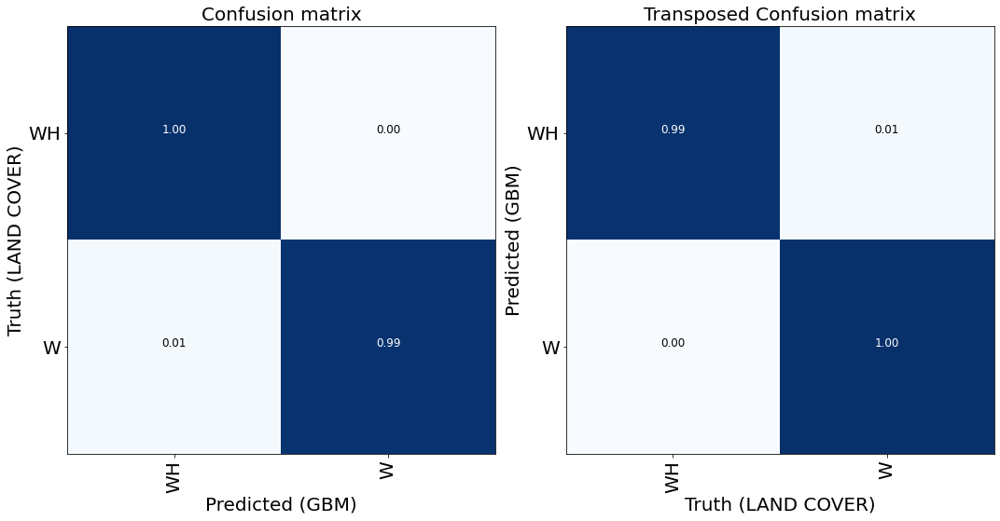

In [ ]:
fig = plt.figure(figsize=(15, 15))

class_names = testing_data["Label"].values
class_labels = testing_classes_int

plt.subplot(1, 2, 1)
conf_matrix_gbm = metrics.confusion_matrix(testing_array[:,0], out_classes)
plot_confusion_matrix(conf_matrix_gbm, 
                      classes=[name for idx, name in enumerate(class_names) if idx in class_labels], 
                      normalize=True, 
                      ylabel='Truth (LAND COVER)', 
                      xlabel='Predicted (GBM)',
                      title='Confusion matrix');

plt.subplot(1, 2, 2)
conf_matrix_gbm = metrics.confusion_matrix(out_classes, testing_array[:,0])
plot_confusion_matrix(conf_matrix_gbm, 
                      classes=[name for idx, name in enumerate(class_names) if idx in class_labels], 
                      normalize=True, 
                      xlabel='Truth (LAND COVER)', 
                      ylabel='Predicted (GBM)',
                      title='Transposed Confusion matrix');

plt.tight_layout()
plt.savefig('confusion_matrix.jpeg')

## Define area of interest

### Load shapefile and create bounding boxes for parallel computing


In [ ]:
# Load geojson file
from geopandas import GeoDataFrame

country = GeoDataFrame.from_file(os.path.join('./drive/My Drive/Sai Gon River(Phase 3 AOI).geojson'))

# Convert CRS to UTM_33N
country_crs = CRS.UTM_48N
country = country.to_crs(crs=country_crs.pyproj_crs())

# Get the country's shape in polygon format
country_shape = country.geometry.tolist()[-1]

# inflate the BBOX
inflate_bbox = 0.1
minx, miny, maxx, maxy = country_shape.bounds

delx = maxx - minx
dely = maxy - miny
minx = minx - delx * inflate_bbox
maxx = maxx + delx * inflate_bbox
miny = miny - dely * inflate_bbox
maxy = maxy + dely * inflate_bbox

dam_bbox = BBox([minx, miny, maxx, maxy], crs=country_crs)

dam_bbox = dam_bbox.geometry - country_shape
dam_gdf = country

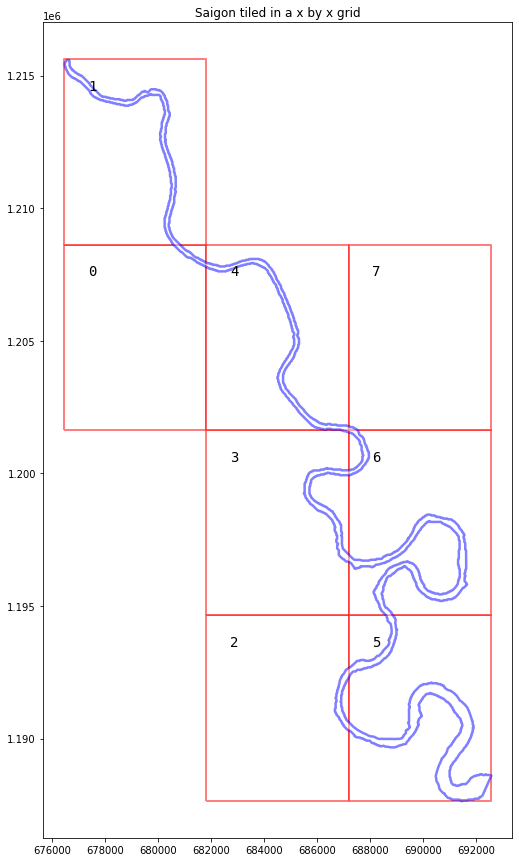

In [ ]:
bbox_splitter = BBoxSplitter([country_shape], country_crs, (3,4))

bbox_list = np.array(bbox_splitter.get_bbox_list())
info_list = np.array(bbox_splitter.get_info_list())

# Create patchIDs
patchIDs = []
for idx, [bbox, info] in enumerate(zip(bbox_list, info_list)):
    patchIDs.append(idx)
    
# Prepare info of selected EOPatches
geometry = [Polygon1(bbox.get_polygon()) for bbox in bbox_list[patchIDs]]
idxs_x = [info['index_x'] for info in info_list[patchIDs]]
idxs_y = [info['index_y'] for info in info_list[patchIDs]]

gdf = gpd.GeoDataFrame({'index_x': idxs_x, 'index_y': idxs_y}, 
                       crs=CRS.ogc_string(country_crs), 
                       geometry=geometry)

poly = gdf['geometry'][0]
x1, y1, x2, y2 = poly.bounds
aspect_ratio = (y1 - y2) / (x1 - x2)
fontdict = {'family': 'monospace', 'weight': 'normal', 'size': 14}
# if bboxes have all same size, estimate offset
xl, yl, xu, yu = gdf.geometry[0].bounds
xoff, yoff = (xu-xl)/3, (yu-yl)/3
# figure
fig, ax = plt.subplots(figsize=(15,15))
gdf.plot(ax=ax, facecolor='w', edgecolor='r', alpha=0.5, linewidth=2)
country.plot(ax=ax, facecolor='w', edgecolor='b', alpha=0.5, linewidth=2.5)
ax.set_title('Saigon tiled in a x by x grid');
# add annotiation text
for idx in gdf.index:
    eop_name = '{0}x{1}'.format(gdf.index_x[idx], gdf.index_y[idx])
    centroid, = list(gdf.geometry[idx].centroid.coords)
    ax.text(centroid[0]-xoff, centroid[1]+yoff, '{}'.format(idx), fontdict=fontdict)
plt.savefig('Phase1 AOI.jpg') 

In [ ]:
add_nominal_water = VectorToRaster(dam_gdf, (FeatureType.MASK_TIMELESS, 'NOMINAL_WATER'), values=1,
                                   raster_shape=(FeatureType.MASK, 'IS_DATA'), raster_dtype=np.uint8)

## Create EO workflow to:

*   Read data from disk
*   Create a cloud mask
*   Create a river mask based on ndwi
*   Add FAI, NDVI
*   Add spatial temporal features
*   Perform Naive bayes classification











In [ ]:
#adapt time_interval according to period of interest
time_interval = ['2020-01-01', '2020-12-30'] # time interval for the SH request

### EO Tasks to compute NDVI and Euclidean Norm

In [ ]:
class SentinelHubValidData:
    """
    Combine Sen2Cor's classification map with `IS_DATA` to define a `VALID_DATA_SH` mask
    The SentinelHub's cloud mask is asumed to be found in eopatch.mask['CLM']
    """
    def __call__(self, eopatch):
        return np.logical_and(eopatch.mask['IS_DATA'].astype(np.bool),
                              np.logical_not(eopatch.mask['CLM'].astype(np.bool)))

class CountValid(EOTask):
    """
    The task counts number of valid observations in time-series and stores the results in the timeless mask.
    """
    def __init__(self, count_what, feature_name):
        self.what = count_what
        self.name = feature_name

    def execute(self, eopatch):
        eopatch.add_feature(FeatureType.MASK_TIMELESS, self.name, np.count_nonzero(eopatch.mask[self.what],axis=0))

        return eopatch

### Create workflow

In [ ]:
from rasterio.plot import reshape_as_raster, reshape_as_image
# TASK FOR BAND DATA
# add a request for B(B02), G(B03), R(B04), NIR (B08), SWIR1(B11), SWIR2(B12) 
# from default layer 'ALL_BANDS' at 10m resolution
# Here we also do a simple filter of cloudy scenes. A detailed cloud cover 
# detection is performed in the next step
custom_script = ['B02', 'B03', 'B04', 'B06', 'B08', 'B11', 'B12']
add_data = SentinelHubInputTask(
    bands_feature=(FeatureType.DATA, 'BANDS'),
    bands = custom_script,
    resolution=10,
    maxcc=0.5,
    data_source=DataSource.SENTINEL2_L2A,
    additional_data=[(FeatureType.MASK, 'dataMask', 'IS_DATA'),
                     (FeatureType.MASK, 'CLM'),
                     (FeatureType.DATA, 'CLP'),
                     (FeatureType.MASK, 'SCL')])



class ValidDataFractionPredicate:
    """ Predicate that defines if a frame from EOPatch's time-series is valid or not. Frame is valid, if the 
    valid data fraction is above the specified threshold.
    """
    def __init__(self, threshold):
        self.threshold = threshold
        
    def __call__(self, array):
        coverage = np.sum(array.astype(np.uint8)) / np.prod(array.shape)
        return coverage > self.threshold
                     

class NormalizedDifferenceIndex(EOTask):   

    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])
        
    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]
        
        ndvi = (band_a - band_b) / (band_a  + band_b)
        
        eopatch.add_feature(FeatureType.DATA, self.feature_name, ndvi[..., np.newaxis])
        
        return eopatch

class PlasticIndex(EOTask):   

    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])
        
    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]
        
        ndvi = (band_b - band_a) / (band_b + band_a)
        
        eopatch.add_feature(FeatureType.DATA, self.feature_name, ndvi[..., np.newaxis])
        
        return eopatch

class FloatingVegetationIndex(EOTask):

    def __init__(self, feature_name, band_a, band_b, band_c, band_d, band_e, band_f, band_g):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_c_fetaure_name = band_c.split('/')[0]
        self.band_d_fetaure_name = band_d.split('/')[0]
        self.band_e_fetaure_name = band_e.split('/')[0]
        self.band_f_fetaure_name = band_f.split('/')[0]
        self.band_g_fetaure_name = band_g.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])
        self.band_c_fetaure_idx = int(band_c.split('/')[-1])
        self.band_d_fetaure_idx = int(band_d.split('/')[-1])
        self.band_e_fetaure_idx = int(band_e.split('/')[-1])
        self.band_f_fetaure_idx = int(band_f.split('/')[-1])
        self.band_g_fetaure_idx = int(band_g.split('/')[-1])
        
    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]
        band_c = eopatch.data[self.band_c_fetaure_name][..., self.band_c_fetaure_idx]
        band_d = eopatch.data[self.band_d_fetaure_name][..., self.band_d_fetaure_idx]
        band_e = eopatch.data[self.band_e_fetaure_name][..., self.band_e_fetaure_idx]
        band_f = eopatch.data[self.band_f_fetaure_name][..., self.band_f_fetaure_idx]
        band_g = eopatch.data[self.band_g_fetaure_name][..., self.band_g_fetaure_idx]
        

        fai = band_e - (((band_c * (842-1610)) + (band_g * (665-842)))/(665-1614))  
        
        eopatch.add_feature(FeatureType.DATA, self.feature_name, fai[..., np.newaxis])
        
        return eopatch

class CyanobacterialIndex(EOTask):

    def __init__(self, feature_name, band_a, band_b, band_c, band_d, band_e, band_f, band_g):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_c_fetaure_name = band_c.split('/')[0]
        self.band_d_fetaure_name = band_d.split('/')[0]
        self.band_e_fetaure_name = band_e.split('/')[0]
        self.band_f_fetaure_name = band_f.split('/')[0]
        self.band_g_fetaure_name = band_g.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])
        self.band_c_fetaure_idx = int(band_c.split('/')[-1])
        self.band_d_fetaure_idx = int(band_d.split('/')[-1])
        self.band_e_fetaure_idx = int(band_e.split('/')[-1])
        self.band_f_fetaure_idx = int(band_f.split('/')[-1])
        self.band_g_fetaure_idx = int(band_g.split('/')[-1])
        
    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]
        band_c = eopatch.data[self.band_c_fetaure_name][..., self.band_c_fetaure_idx]
        band_d = eopatch.data[self.band_d_fetaure_name][..., self.band_d_fetaure_idx]
        band_e = eopatch.data[self.band_e_fetaure_name][..., self.band_e_fetaure_idx]
        band_f = eopatch.data[self.band_f_fetaure_name][..., self.band_f_fetaure_idx]
        band_g = eopatch.data[self.band_g_fetaure_name][..., self.band_g_fetaure_idx]

        fai = eopatch.data['FAI']
        ndvi = eopatch.data['NDVI']
        band_c = eopatch.data['BANDS'][..., [2]]
        band_e = eopatch.data['BANDS'][..., [4]]
        band_f = eopatch.data['BANDS'][..., [6]]

        img = np.concatenate((ndvi, fai, band_c, band_e, band_f),axis=-1)
        img = np.nan_to_num(img)

        class_prediction = class_model.predict(img.reshape(-1, 5))

        # Reshape our classification map back into a 2D matrix so we can visualize it
        class_prediction = class_prediction.reshape(img[:, :, :, 0].shape)

        "Hier moet de class_model prediction komen die rekening houdt met tijd, grootte en uitkomst"


        eopatch.add_feature(FeatureType.DATA, self.feature_name, class_prediction[..., np.newaxis])
        
        return eopatch
  
# TASKS FOR CALCULATING NEW FEATURES
# NDVI: (B08 - B04)/(B08 + B04)
# NDWI: (B03 - B08)/(B03 + B08)
# NORM: sqrt(B02^2 + B03^2 + B04^2 + B08^2 + B11^2 + B12^2)
ndvi = NormalizedDifferenceIndex('NDVI', 'BANDS/4', 'BANDS/2')
ndwi = NormalizedDifferenceIndex('NDWI', 'BANDS/1', 'BANDS/3')
plastic = NormalizedDifferenceIndex('PLASTIC', 'BANDS/4', 'BANDS/0')
fai = FloatingVegetationIndex('FAI', 'BANDS/0', 'BANDS/1', 'BANDS/2', 'BANDS/3', 'BANDS/4', 'BANDS/5', 'BANDS/6')
cmi = CyanobacterialIndex('CMI', 'BANDS/0', 'BANDS/1', 'BANDS/2', 'BANDS/3', 'BANDS/4', 'BANDS/5', 'BANDS/6')

def calculate_coverage(array):
    return 1.0 - np.count_nonzero(array) / np.size(array)

class AddValidDataCoverage(EOTask):

    def execute(self, eopatch):

        valid_data = eopatch.get_feature(FeatureType.MASK, 'IS_VALID')
        time, height, width, channels = valid_data.shape

        coverage = np.apply_along_axis(calculate_coverage, 1,
                                       valid_data.reshape((time, height * width * channels)))

        eopatch.add_feature(FeatureType.SCALAR, 'COVERAGE', coverage[:, np.newaxis])
        return eopatch

add_coverage = AddValidDataCoverage()

# TASK FOR VALID MASK
# validate pixels using SentinelHub's cloud detection mask and region of acquisition
add_sh_valmask = AddValidDataMaskTask(SentinelHubValidData(),
                                      'IS_VALID' # name of output mask
                                     )

# TASK FOR COUNTING VALID PIXELS
# count number of valid observations per pixel using valid data mask
count_val_sh = CountValid('IS_VALID', # name of existing mask
                          'VALID_COUNT' # name of output scalar
                         )

class WaterDetector(EOTask):

    @staticmethod
    def detect_water(ndwi):
        """
        Very simple water detector based on Otsu thresholding method of NDWI.
        """
        otsu_thr = 1.0
        if len(np.unique(ndwi)) > 1:
            otsu_thr = threshold_otsu(ndwi)

        return ndwi > otsu_thr

    def execute(self, eopatch):
        water_masks = np.asarray([self.detect_water(ndwi[...,0]) for ndwi in eopatch.data['NDWI']])

        # we're only interested in the water within the dam borders
        water_masks = water_masks[...,np.newaxis] * eopatch.mask_timeless['NOMINAL_WATER']

        water_levels = np.asarray([np.count_nonzero(mask)/np.count_nonzero(eopatch.mask_timeless['NOMINAL_WATER'])
                                   for mask in water_masks])

        eopatch.add_feature(FeatureType.MASK, 'WATER_MASK', water_masks)
        eopatch.add_feature(FeatureType.SCALAR, 'WATER_LEVEL', water_levels[...,np.newaxis])

        return eopatch

water_detection = WaterDetector()

# TASK FOR FILTERING OUT TOO CLOUDY SCENES
# keep frames with > 80 % valid coverage
valid_data_predicate = ValidDataFractionPredicate(0.01)
filter_task = SimpleFilterTask((FeatureType.MASK, 'IS_VALID'), valid_data_predicate)

# TASK FOR SAVING TO OUTPUT (if needed)
path_out = './eopatches/'
if not os.path.isdir(path_out):
    os.makedirs(path_out)
save = SaveTask(path_out, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

/usr/local/lib/python3.6/dist-packages/sentinelhub/data_collections.py:558: SHDeprecationWarning: Parameter data_source is deprecated, use data_collection instead
  category=SHDeprecationWarning)


### Define the workflow

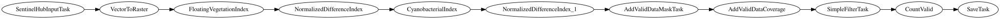

In [ ]:
#workflow = LinearWorkflow(add_data, add_nominal_water, fai, ndvi, cmi, ndwi, add_sh_valmask, count_val_sh, water_detection, save)
#workflow.dependency_graph('graph.png')

workflow = LinearWorkflow(add_data, add_nominal_water, fai, ndvi, cmi, plastic, add_sh_valmask, add_coverage, filter_task, count_val_sh, save)
workflow.dependency_graph('graph.png')

### Execute the workflow for each patch

In [ ]:
%%time

# Execute the workflow
# define additional parameters of the workflow
execution_args = []
for idx, bbox in enumerate(bbox_list[patchIDs]):
    execution_args.append({
        add_data:{'bbox': bbox, 'time_interval': time_interval},
        save: {'eopatch_folder': 'eopatch_{}'.format(idx)}
    })
    
executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run(workers=12, multiprocess=True)

executor.make_report()

/usr/local/lib/python3.6/dist-packages/eolearn/geometry/transformations.py:178: RuntimeWarning: Given vector polygons contain some 3D geometries, they will be projected to 2D
  RuntimeWarning)
/usr/local/lib/python3.6/dist-packages/shapely/geometry/base.py:369: DeprecationWarning: `to_wkt` is deprecated. Use the `wkt` property.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/shapely/geometry/base.py:113: DeprecationWarning: `geom_to_wkt` is deprecated. Use `geos.wkt_writer.write(ob)`.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/eolearn/geometry/transformations.py:178: RuntimeWarning: Given vector polygons contain some 3D geometries, they will be projected to 2D
  RuntimeWarning)
/usr/local/lib/python3.6/dist-packages/shapely/geometry/base.py:369: DeprecationWarning: `to_wkt` is deprecated. Use the `wkt` property.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/shapely/geometry/base.py:113: DeprecationWarning: `geom_to_wkt` is deprecated. Use `


CPU times: user 228 ms, sys: 210 ms, total: 438 ms
Wall time: 6min 26s


### Loop to create a list with dates in which each patch contains the same dates

In [ ]:
# lazy load all eopatches
eop_locations = []
eop_locations = [f'/content/eopatches/eopatch_0', f'/content/eopatches/eopatch_1', f'/content/eopatches/eopatch_2', f'/content/eopatches/eopatch_3', f'/content/eopatches/eopatch_4', f'/content/eopatches/eopatch_5', f'/content/eopatches/eopatch_6', f'/content/eopatches/eopatch_7']
eopatches = []
for loc in eop_locations:
    eop = EOPatch.load(loc, lazy_loading = True)
    eopatches.append(eop)

# create sets of dates
sets = [set([ts for ts in eop.timestamp]) for eop in eopatches]

# loop through eop timestamps, keep only intersections
dt_list = sets[0]
for i in range(1,len(sets)):
    dt_list = dt_list.intersection(sets[i])

# convert to array, sort
dt_list = np.array(list(dt_list))
dt_list = np.sort(dt_list)

In [ ]:
dt_list

array([datetime.datetime(2020, 1, 1, 3, 34, 52),
       datetime.datetime(2020, 1, 3, 3, 24, 56),
       datetime.datetime(2020, 1, 6, 3, 34, 51),
       datetime.datetime(2020, 1, 13, 3, 24, 56),
       datetime.datetime(2020, 1, 16, 3, 34, 51),
       datetime.datetime(2020, 1, 21, 3, 34, 50),
       datetime.datetime(2020, 1, 23, 3, 24, 55),
       datetime.datetime(2020, 1, 26, 3, 34, 50),
       datetime.datetime(2020, 1, 28, 3, 24, 54),
       datetime.datetime(2020, 2, 5, 3, 34, 48),
       datetime.datetime(2020, 2, 7, 3, 24, 56),
       datetime.datetime(2020, 2, 10, 3, 34, 52),
       datetime.datetime(2020, 2, 12, 3, 24, 55),
       datetime.datetime(2020, 2, 15, 3, 34, 50),
       datetime.datetime(2020, 2, 20, 3, 34, 53),
       datetime.datetime(2020, 2, 22, 3, 24, 56),
       datetime.datetime(2020, 2, 25, 3, 34, 52),
       datetime.datetime(2020, 2, 27, 3, 24, 59),
       datetime.datetime(2020, 3, 13, 3, 24, 58),
       datetime.datetime(2020, 3, 16, 3, 34, 53),
     

### Experimental cloud masking system to create masks based on 10m resolution

In [ ]:
path_out = './eopatches'
# TASK TO LOAD EXISTING EOPATCHES
load = LoadTask(path_out)

path_out_sampled = './eopatches_sampled'
if not os.path.isdir(path_out_sampled):
    os.makedirs(path_out_sampled)
save = SaveTask(path_out_sampled, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)


from functools import partial
from datetime import timedelta

def dt_list_filter(date, date_list, tolerance):
    return np.min(np.abs(date - np.array(date_list))) <= tolerance


class cloud_mask(EOTask):

    def __init__(self, feature_name):
      self.feature_name = feature_name
        
    def execute(self, eopatch):
      # mask of valid CLM values (0 = no cloud, 1 = cloud, 2 = no data)
      valid_clm = eop.mask['CLM'] == 1

      # mask of valid SCL values (4 = vegetation, 5 = baresoil, 6 = water)
      valid_scl = (eop.mask['SCL'] == 4) | (eop.mask['SCL'] == 5) | (eop.mask['SCL'] == 6)

      # merge valid masks together (i.e. only where both are valid)
      valid_mask = valid_clm  | valid_scl

      eopatch.add_feature(FeatureType.MASK, self.feature_name, valid_mask)
      return eopatch

cloud_mask2 = cloud_mask('VALID_MASK')

filter_task2 = SimpleFilterTask(feature=FeatureType.TIMESTAMP, 
                         filter_func=partial(dt_list_filter, date_list=dt_list, tolerance=timedelta(days=0))) 

### Define the workflow #2

In [ ]:
# Define the workflow
workflow = LinearWorkflow(
    load,
    filter_task2,
    cloud_mask2,
    save
)

### Execute the workflow for each patch #2

In [ ]:
%%time
   
execution_args = []
for idx in range(len(patchIDs)):
    execution_args.append({
        load: {'eopatch_folder': f'eopatch_{idx}'},
        save: {'eopatch_folder': f'eopatch_{idx}'}
    })
    
executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run(workers=12, multiprocess=True)

executor.make_report()


CPU times: user 103 ms, sys: 161 ms, total: 263 ms
Wall time: 3min 44s


## Visualise the processed imagery

In [ ]:
# for correct location of patches within visusalization below we need to index them, this is done below.
indexes = [[ 1],
           [ 0,   4,  7],
               [  3,  6], 
               [  2,  5]]

places =  [[ 1],
           [ 4,   5,  6],
               [  8,  9], 
               [ 11, 12]]


### Plot visible spectrum at a particular date

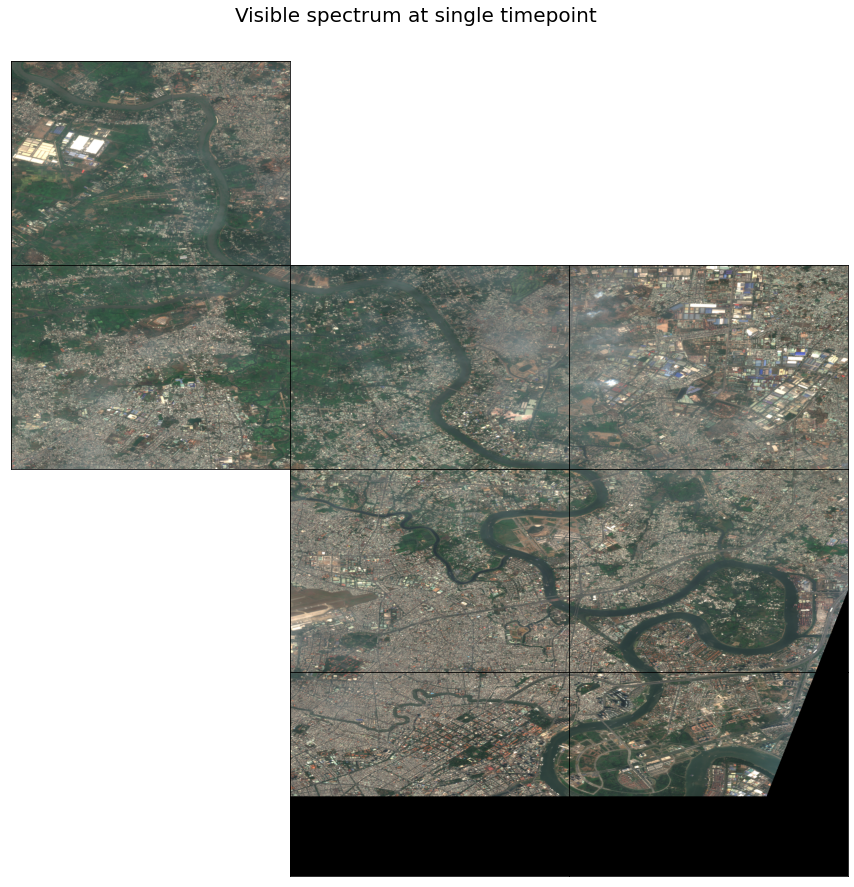

In [ ]:
path_out = './eopatches_sampled'
fig = plt.figure(figsize=(15, 15))
k=0

date_idx= 14

for i,  (idxs, plc) in enumerate(zip(indexes, places)):
    for j, (idx, p) in enumerate(zip(idxs, plc)):
        k=k+1
        eopatch = EOPatch.load(f'{path_out}/eopatch_{idx}', lazy_loading=True)
        ax = plt.subplot(4, 3, p)
        plt.imshow(np.clip(eopatch.data['BANDS'][date_idx][..., [2, 1, 0]] * 3.5, 0, 1))
        plt.xticks([])
        plt.yticks([])
        ax.set_aspect("auto")
        del eopatch
        
fig.suptitle('Visible spectrum at single timepoint', y=0.93, size=20)
plt.savefig('Visible spectrum at single timepoint.jpg') 
fig.subplots_adjust(wspace=0, hspace=0)



### Take a closer look at a patch (visible spectrum)

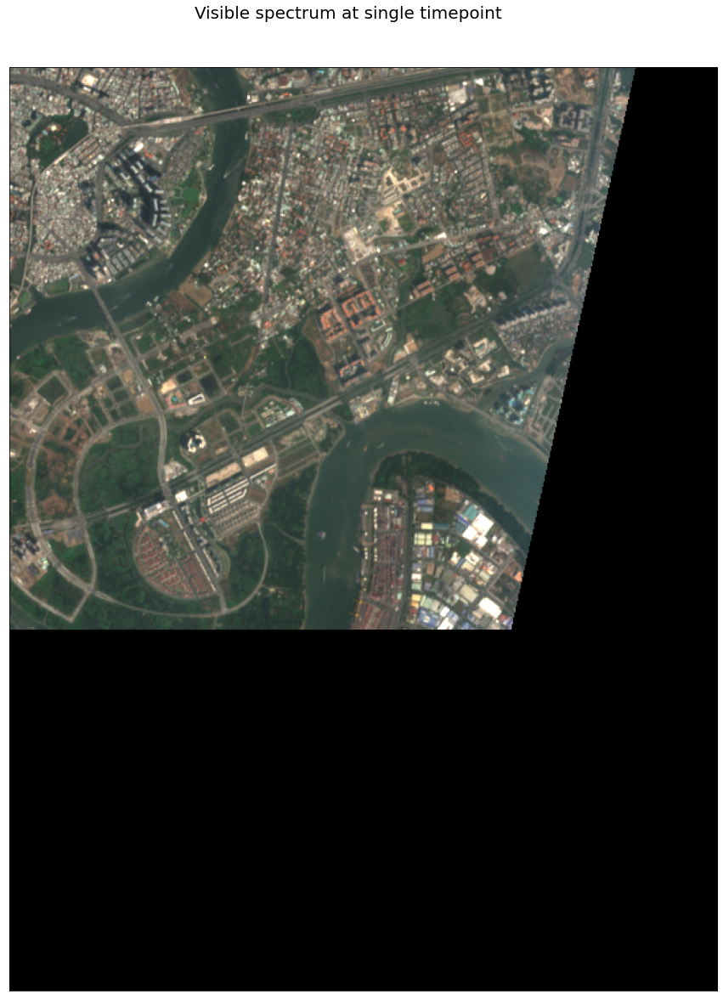

In [ ]:
fig = plt.figure(figsize=(20,20))
eopatch = EOPatch.load(f'{path_out}/eopatch_5', lazy_loading=True)
plt.imshow(np.clip(eopatch.data['BANDS'][date_idx][..., [2, 1, 0]] * 3.5, 0, 1))
plt.xticks([])
plt.yticks([])
fig.suptitle('Visible spectrum at single timepoint', y=0.93, size=20)
del eopatch

### Plot classified Water Hyacinth (Naive Bayes classification)

date of imagery:  2020-02-20 03:34:53


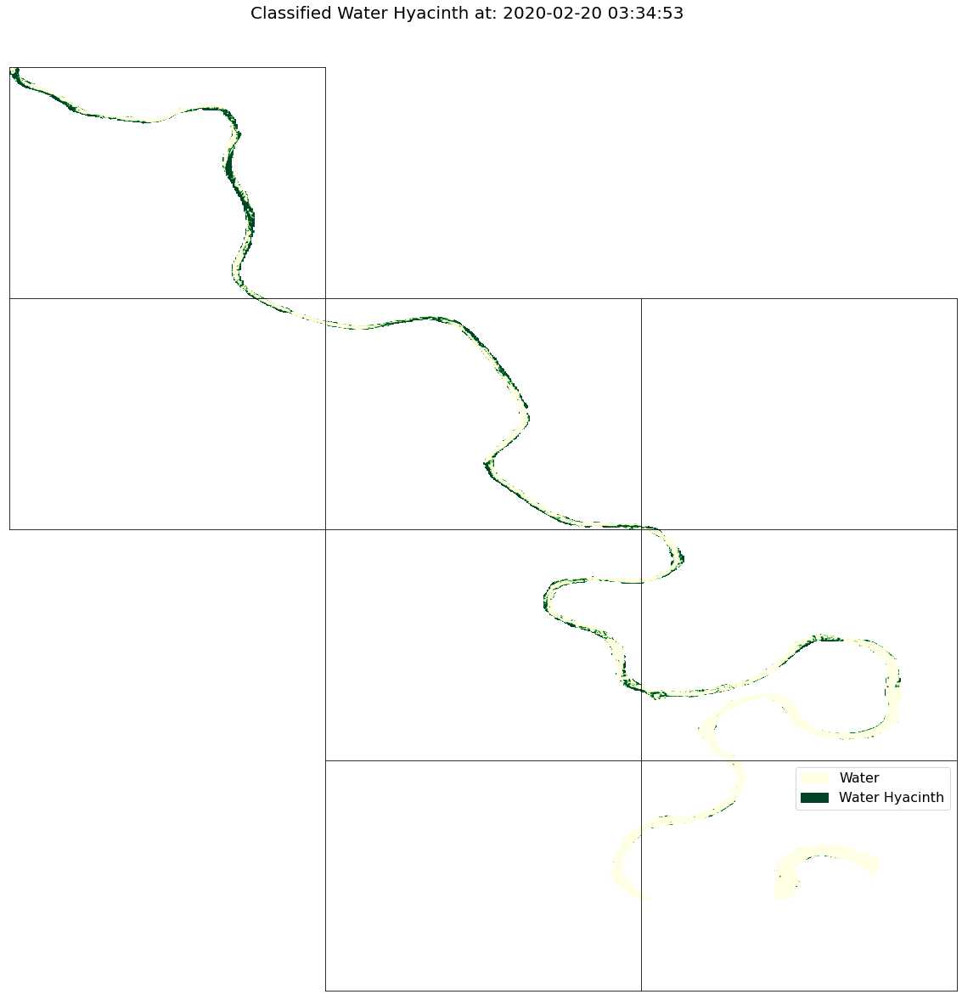

In [ ]:
path_out = './eopatches_sampled'

fig = plt.figure(figsize=(20, 20))
k=0
area = []

for i,  (idxs, plc) in enumerate(zip(indexes, places)):
    for j, (idx, p) in enumerate(zip(idxs, plc)):
        k=k+1
        eopatch = EOPatch.load(f'{path_out}/eopatch_{idx}', lazy_loading=True)
        ax = plt.subplot(4, 3, p)
        mask = eopatch.mask['IS_VALID'][date_idx].astype(bool)
        mask1 = eopatch.mask_timeless['NOMINAL_WATER'].astype(bool) # mask of valid pixels
        cmi = eopatch.data['CMI'][date_idx]
        cmi[~mask] = np.nan
        cmi[~mask1] = np.nan
        area = (np.count_nonzero(cmi == 1)) / 100
        date = eopatch.timestamp[date_idx]
        im = plt.imshow(cmi.squeeze(), cmap=plt.get_cmap('YlGn'))
        plt.xticks([])
        plt.yticks([])
        ax.set_aspect("auto")
        del eopatch


fig.subplots_adjust(wspace=0, hspace=0)
fig.suptitle('Classified Water Hyacinth at: ' + str(date), y=0.93, size=20)
print('date of imagery: ', date)
cmap=plt.get_cmap('YlGn')
my_colors = {
    'Water' : 1,
    'Water Hyacinth' : 2.0,
    }

patches = [mpatches.Patch(color=cmap(v), label=k) for k,v in my_colors.items()]

plt.legend(handles=patches, prop={'size': 16})
plt.show()
plt.savefig('Complete_Map_WaterHyacinth.jpg') 

### Take a closer look at a patch (classified Water Hyacinth)

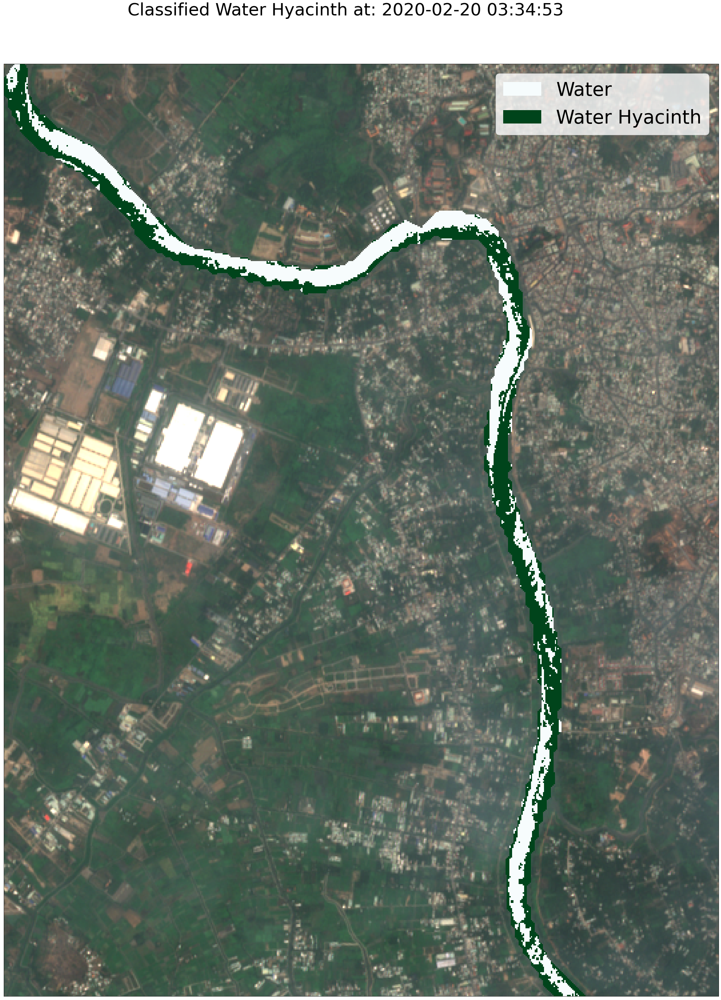

In [ ]:
fig = plt.figure(figsize=(50,50))
eopatch = EOPatch.load(f'{path_out}/eopatch_1', lazy_loading=True)
mask = eopatch.mask['IS_VALID'][date_idx].astype(bool)
mask1 = eopatch.mask_timeless['NOMINAL_WATER'].astype(bool) # mask of valid pixels
cmi = eopatch.data['CMI'][date_idx]
cmi[~mask] = np.nan
cmi[~mask1] = np.nan
im = plt.imshow(np.clip(eopatch.data['BANDS'][date_idx][..., [2, 1, 0]] * 3.5, 0, 1))
im = plt.imshow(cmi.squeeze(), cmap=plt.get_cmap('BuGn'))
plt.xticks([])
plt.yticks([])

fig.suptitle('Classified Water Hyacinth at: ' + str(date), y=0.93, size=50)

cmap=plt.get_cmap('BuGn')
my_colors = {
    'Water' : 1,
    'Water Hyacinth' : 2.0,
    }

patches = [mpatches.Patch(color=cmap(v), label=k) for k,v in my_colors.items()]

plt.legend(handles=patches, prop={'size': 55})


plt.show()
plt.savefig('Patch_map_classified_waterhyacinth.jpg') 
del eopatch

### Take a closer look at a patch (suspected plastics within classified Water Hyacinth)

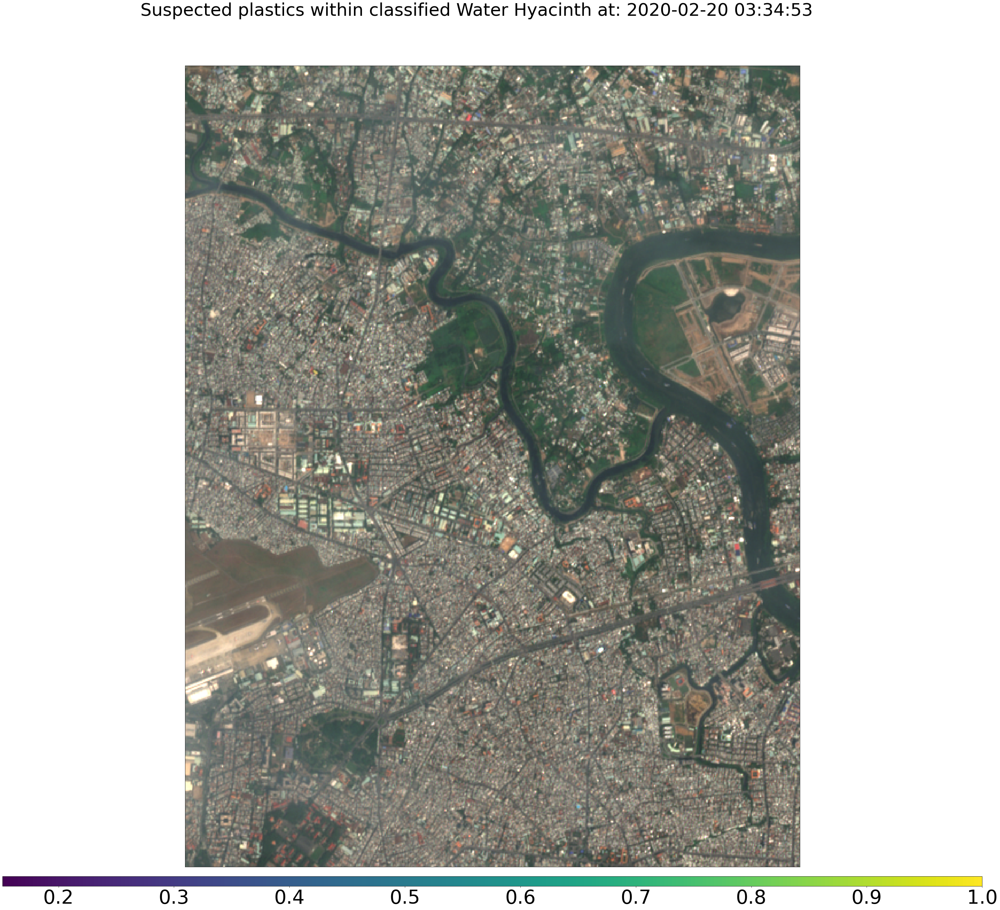

In [ ]:
fig = plt.figure(figsize=(50,50))
eopatch = EOPatch.load(f'{path_out}/eopatch_3', lazy_loading=True)
mask = eopatch.mask['IS_VALID'][date_idx].astype(bool)
mask1 = eopatch.mask_timeless['NOMINAL_WATER'].astype(bool) # mask of valid pixels
cmi = eopatch.data['CMI'][date_idx]
mask2 = cmi == 2.0
swir2 = eopatch.data['PLASTIC'][date_idx]
#band12 = np.sum(eopatch.data['BANDS'][date_idx][..., [6, 1, 0]])
swir2[~mask] = np.nan
swir2[~mask1] = np.nan
swir2[~mask2] = np.nan

im = plt.imshow(np.clip(eopatch.data['BANDS'][date_idx][..., [2, 1, 0]] * 3.5, 0, 1))
#im = plt.imshow(swir2.squeeze(), cmap=plt.get_cmap('coolwarm'))

plt.xticks([])
plt.yticks([])

fig.suptitle('Suspected plastics within classified Water Hyacinth at: ' + str(date), y=0.93, size=50)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=55)

plt.show()
plt.savefig('Patch_map_plastics_within_waterhyacinth.jpg') 
del eopatch

In [ ]:
path_out = './eopatches_sampled'

fig = plt.figure(figsize=(200, 200))
k=0
area = []

for i,  (idxs, plc) in enumerate(zip(indexes, places)):
    for j, (idx, p) in enumerate(zip(idxs, plc)):
        k=k+1
        eopatch = EOPatch.load(f'{path_out}/eopatch_{idx}', lazy_loading=True)
        ax = plt.subplot(4, 3, p)
        mask = eopatch.mask['IS_VALID'][date_idx].astype(bool)
        mask1 = eopatch.mask_timeless['NOMINAL_WATER'].astype(bool) # mask of valid pixels
        cmi = eopatch.data['CMI'][date_idx]
        cmi[~mask] = np.nan
        cmi[~mask1] = np.nan
        mask2 = cmi == 2.0
        swir2 = eopatch.data['PLASTIC'][date_idx]
        band12 = np.sum(eopatch.data['BANDS'][date_idx][..., [6, 1, 0]])
        swir2[~mask] = np.nan
        swir2[~mask1] = np.nan
        swir2[~mask2] = np.nan
        date = eopatch.timestamp[date_idx]
        im = plt.imshow(swir2.squeeze(), cmap=plt.get_cmap('coolwarm'))
        plt.xticks([])
        plt.yticks([])
        ax.set_aspect("auto")
        fig.patch.set_visible(False)
        ax.axis('off')    
        del eopatch

fig.subplots_adjust(wspace=0, hspace=0)
#fig.suptitle('Suspected plastics in classified water hyacinth at: ' + str(date), y=0.93, size=50)
#cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.01, aspect=100)
#cb.ax.tick_params(labelsize=55)
plt.savefig('Complete_map_plastics_within_waterhyacinth.jpg') 
plt.show()

### Variance in SWIR2 band in classified Water Hyacinth over time

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: Mean of empty slice


<Figure size 1080x1080 with 0 Axes>

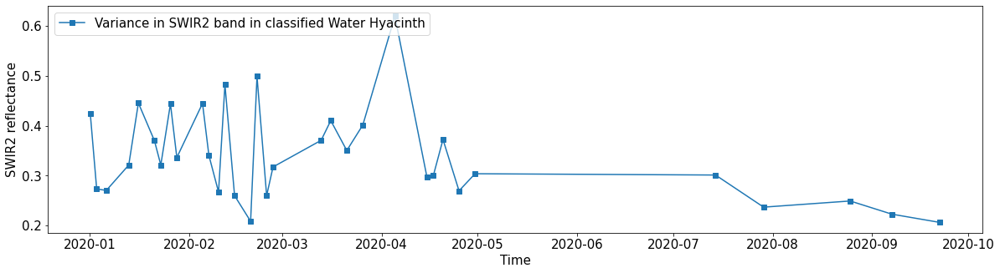

In [ ]:
path_out = './eopatches_sampled'
fig = plt.figure(figsize=(15, 15))
results = []
sum_area = []
for i in range(len(patchIDs)):
    eopatch = EOPatch.load(f'{path_out}/eopatch_{i}', lazy_loading=True)
    mask = eopatch.mask['IS_VALID'].astype(bool)
    mask1 = eopatch.mask_timeless['NOMINAL_WATER'].astype(bool)

    cmi = eopatch.data['CMI']
    mask1 = np.broadcast_to(mask1, cmi.shape)
    cmi[~mask] = np.nan
    cmi[~mask1] = np.nan
    mask2 = cmi == 2
    band12 = eopatch.data['PLASTIC']
    band12[~mask] = np.nan
    band12[~mask1] = np.nan
    band12[~mask2] = np.nan
    time = np.array(eopatch.timestamp)
    t, w, h, _ = band12.shape

    # Calculate means, remove NaN's from means
    savi_mean_clean = np.nanmean(band12.reshape(t, w * h).squeeze(), axis=1)
    #gewicht met aantal pixels erbij berekenen zodat niet elke patch dezelfde waarde krijgt in de berekening van np.nanmean
    # 
    # https://stackoverflow.com/questions/21113384/python-numpy-weighted-average-with-nans
    results.append(savi_mean_clean)

res = np.nanmean(results, axis=0)
fig = plt.figure(figsize=(20,5))
plt.plot(time, res, 's-', label = 'Variance in SWIR2 band in classified Water Hyacinth')
plt.xlabel('Time', fontsize=15)
plt.ylabel('SWIR2 reflectance', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.legend(loc=2, prop={'size': 15});

### Plot Sum of suspected Water Hyacinth over time


<Figure size 1080x1080 with 0 Axes>

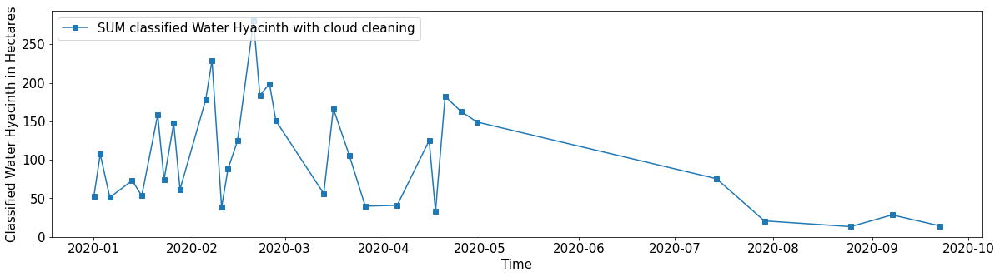

In [ ]:
path_out = './eopatches_sampled'
fig = plt.figure(figsize=(15, 15))
results = []
results2 = []
for i in range(len(patchIDs)):
  eopatch = EOPatch.load(f'{path_out}/eopatch_{i}', lazy_loading=True)
  mask = eopatch.mask['IS_VALID'].astype(bool)
  mask1 = eopatch.mask_timeless['NOMINAL_WATER'].astype(bool)

  cmi = eopatch.data['CMI']
  mask1 = np.broadcast_to(mask1, cmi.shape)
  cmi[~mask] = np.nan
  cmi[~mask1] = np.nan
  time = np.array(eopatch.timestamp)
  t, w, h, _ = cmi.shape
  # Calculate means, remove NaN's from means
  savi_mean_clean = (np.count_nonzero(cmi.reshape(t, w * h).squeeze() ==2, axis=1)) /100
  time_clean = time[~np.isnan(savi_mean_clean)]
  savi_mean_clean = savi_mean_clean[~np.isnan(savi_mean_clean)]
  
  results.append(savi_mean_clean)

res = np.nansum(results, axis=0)


fig = plt.figure(figsize=(20,5))
plt.plot(time_clean, res, 's-', label = 'SUM classified Water Hyacinth with cloud cleaning')
plt.xlabel('Time', fontsize=15)
plt.ylabel('Classified Water Hyacinth in Hectares', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.legend(loc=2, prop={'size': 15});

### Plot Sum of Water Hyacinth of all patches averaged out for each month

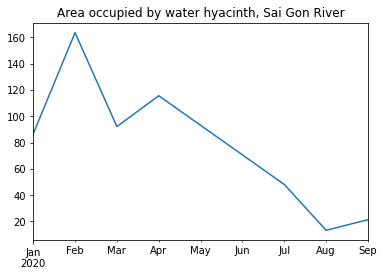

In [ ]:
path_out = './eopatches_sampled'
results = []
for i in range(len(patchIDs)):
  eopatch = EOPatch.load(f'{path_out}/eopatch_{i}', lazy_loading=True)
  mask = eopatch.mask['IS_VALID'].astype(bool)
  mask1 = eopatch.mask_timeless['NOMINAL_WATER'].astype(bool)

  cmi = eopatch.data['CMI']
  mask1 = np.broadcast_to(mask1, cmi.shape)
  cmi[~mask] = np.nan
  cmi[~mask1] = np.nan
  time = np.array(eopatch.timestamp)
  t, w, h, _ = cmi.shape
  # Calculate means, remove NaN's from means
  savi_mean_clean = (np.count_nonzero(cmi.reshape(t, w * h).squeeze() ==2, axis=1)) /100
  time_clean = time[~np.isnan(savi_mean_clean)]
  savi_mean_clean = savi_mean_clean[~np.isnan(savi_mean_clean)]
  results.append(savi_mean_clean)



# Using naive method 
res = list() 
for j in range(0, len(results[0])): 
    tmp = 0
    for i in range(0, len(results)): 
        tmp = tmp + results[i][j] 
    res.append(tmp) 


data = res, time_clean
# Creating pandas dataframe from numpy array
df4 = pd.DataFrame(data)
df4_transposed = df4.transpose()
df4_transposed_time = df4_transposed.iloc[:, 1]
df4_transposed_time = pd.to_datetime(df4_transposed_time).dt.date
datetime_series = pd.to_datetime(df4_transposed_time)
# create datetime index passing the datetime series
datetime_index = pd.DatetimeIndex(datetime_series.values)
df5=df4_transposed.set_index(datetime_index)
# we don't need the column anymore
df5.drop(1,axis=1,inplace=True)
df5 = df5[0]
df6 = pd.to_numeric(df5, errors='coerce')
df7 = df6.resample('M').mean()
df8 = df7.interpolate()
#visualize the columns
import matplotlib.pyplot as plt
# gca stands for 'get current axis'
ax = plt.gca()
df8.plot(kind='line',y='0',ax=ax)
df8.to_csv('test.csv')
plt.title('Area occupied by water hyacinth, Sai Gon River')
plt.show()
plt.savefig('monthly_waterhyacinth.jpg') 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: Mean of empty slice


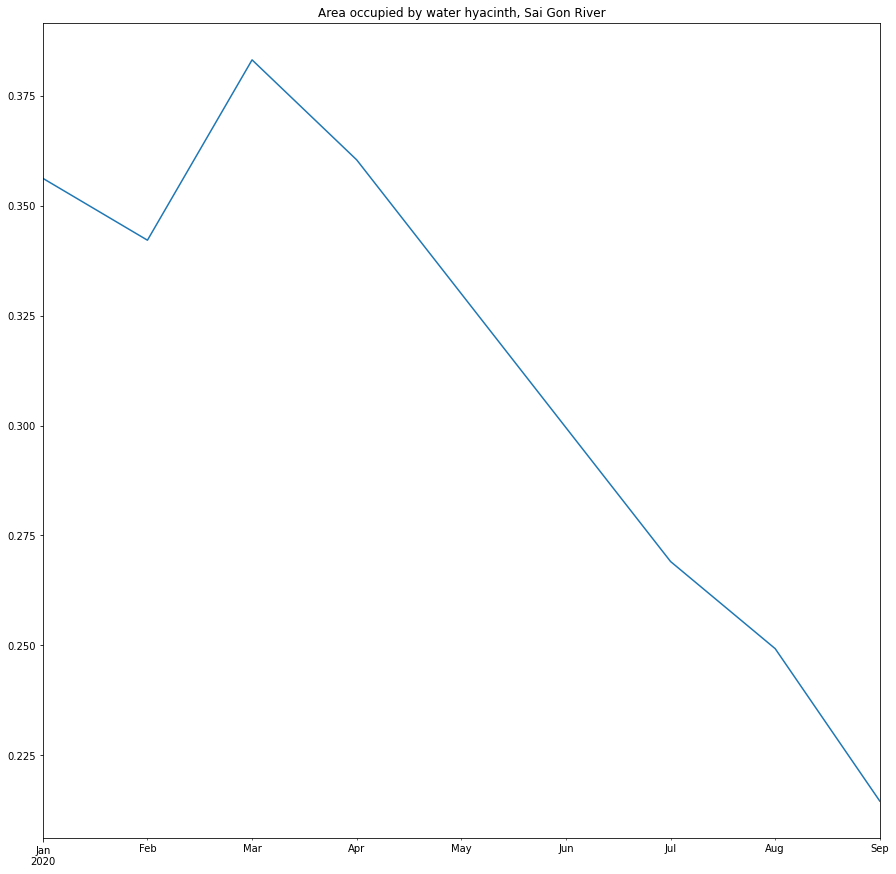

In [ ]:
path_out = './eopatches_sampled'
fig = plt.figure(figsize=(15, 15))
results = []
sum_area = []
for i in range(len(patchIDs)):
    eopatch = EOPatch.load(f'{path_out}/eopatch_{i}', lazy_loading=True)
    mask = eopatch.mask['IS_VALID'].astype(bool)
    mask1 = eopatch.mask_timeless['NOMINAL_WATER'].astype(bool)

    cmi = eopatch.data['CMI']
    mask1 = np.broadcast_to(mask1, cmi.shape)
    cmi[~mask] = np.nan
    cmi[~mask1] = np.nan
    mask2 = cmi == 2
    band12 = eopatch.data['PLASTIC']
    band12[~mask] = np.nan
    band12[~mask1] = np.nan
    band12[~mask2] = np.nan
    time = np.array(eopatch.timestamp)
    t, w, h, _ = band12.shape

    # Calculate means, remove NaN's from means
    savi_mean_clean = np.nanmean(band12.reshape(t, w * h).squeeze(), axis=1)
    #gewicht met aantal pixels erbij berekenen zodat niet elke patch dezelfde waarde krijgt in de berekening van np.nanmean
    # 
    # https://stackoverflow.com/questions/21113384/python-numpy-weighted-average-with-nans
    results.append(savi_mean_clean)

res = np.nanmean(results, axis=0)
data = res, time_clean
# Creating pandas dataframe from numpy array
df4 = pd.DataFrame(data)
df4_transposed = df4.transpose()
df4_transposed_time = df4_transposed.iloc[:, 1]
df4_transposed_time = pd.to_datetime(df4_transposed_time).dt.date
datetime_series = pd.to_datetime(df4_transposed_time)
# create datetime index passing the datetime series
datetime_index = pd.DatetimeIndex(datetime_series.values)
df5=df4_transposed.set_index(datetime_index)
# we don't need the column anymore
df5.drop(1,axis=1,inplace=True)
df5 = df5[0]
df6 = pd.to_numeric(df5, errors='coerce')
df7 = df6.resample('M').mean()
df8 = df7.interpolate()
#visualize the columns
import matplotlib.pyplot as plt
# gca stands for 'get current axis'
ax = plt.gca()
df8.plot(kind='line',y='0',ax=ax)
df8.to_csv('test.csv')
plt.title('Area occupied by water hyacinth, Sai Gon River')
plt.show()
plt.savefig('monthly_waterhyacinth.jpg') 

### Plot measured Water Hyacinth seasonal variability in order to compare with processed image derived data


In [ ]:
# LOADING THE IN SITU MEASUREMENTS INTO PANDAS DATAFRAME and visualize seasonal variability
def plot_in_situ_measurements(input_xlsx, sheet_name):
  sheets = pd.read_excel('/content/' + input_xlsx, sheet_name=[sheet_name])
  df = pd.concat(sheets[frame] for frame in sheets.keys())
  #convert the column (it's a string) to datetime type
  datetime_series = pd.to_datetime(df['Date'])
  # create datetime index passing the datetime series
  datetime_index = pd.DatetimeIndex(datetime_series.values)
  df2=df.set_index(datetime_index)
  # we don't need the column anymore
  df2.drop('Date',axis=1,inplace=True)
  df2 = df2['M_plast \n[kg]']
  df3 = df2.resample('M').sum()
  df4 = df3.interpolate()
  #visualize the columns
  import matplotlib.pyplot as plt
  # gca stands for 'get current axis'
  # create figure and axis objects with subplots()
  fig,ax = plt.subplots()
  ax2=ax.twinx()
  df4.plot(kind='line',x= 'month',y='measured plastic material in kg',ax=ax, marker="o", color="orange")
  df8.plot(kind='line',x= 'month',y='plastic index within classified E.crassipes in ha',ax=ax2, marker="o", color="blue")
  ax.set_ylabel("Measured plastic material in kg",color="orange",fontsize=14)
  ax2.set_ylabel("Plastic index within classified E.crassipes in ha",color="blue",fontsize=14)
  plt.show()
  import scipy.stats as stats
  r, p = stats.pearsonr(df8.dropna(), df4.dropna())
  print(f"Scipy computed Pearson r: {r} and p-value: {p}")
  overall_pearson_r = df8.corr(df4)
  print(f"Pandas computed Pearson r: {overall_pearson_r}")
  ax.set(title=f"Overall Pearson r = {np.round(overall_pearson_r,2)}");
  plt.savefig('monthly_measurements.jpeg')

ValueError: ignored

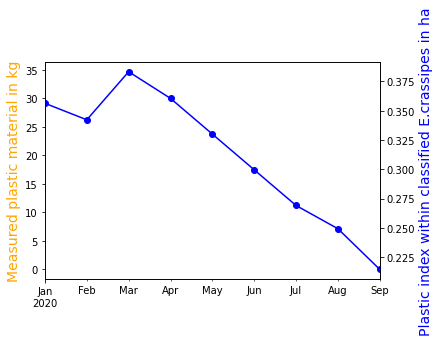

In [ ]:
plot_in_situ_measurements('drive/My Drive/In_situ_measurements.xlsx', 'Sampling')

In [ ]:
data = {"Eichhornia crassipes surface area estimated from Sentinel-2 (ha)": [0.35, 2.45, 0.7, 0.36, 1.22, 2.07], 
        "Eichhornia crassipes surface area from GoogleEarth image digitalisation (ha)": [0.7, 2.8, 1.2, 0.2, 0.4, 8.4],
}
df = pd.DataFrame (data, columns = ['Eichhornia crassipes surface area estimated from Sentinel-2 (ha)','Eichhornia crassipes surface area from GoogleEarth image digitalisation (ha)'])
print(df)

In [ ]:
!apt-get install texlive texlive-xetex texlive-latex-extra pandoc
!pip install pypandoc

In [ ]:
!jupyter nbconvert --to PDF "/content/drive/My Drive/Colab Notebooks/Water_Hyacinth_classification_tool.ipynb"